# Agrupamiento de instituciones de educación superior de EEUU.

Integrantes: 

- Jakelin Daiana Correa Palacio

- Daniela Guardia Cuervo

- Dayra Gabriela Chamorro Revelo

- Fredy Alberto Orozco Loaiza

- Cristian Camilo Henao Rojas

Objetivo: Ayudar a familias latinas en Estados Unidos a elegir una institución de educación superior que se adecue a sus necesidades.
Población objetivo: Población latina en Estados Unidos interesados en ingresar a una institución de educación superior.


In [1]:
import os
import sklearn
import pandas as pd
import re
import missingno as msno
import  seaborn as sns
import matplotlib.pyplot as plt

from sklearn import model_selection
from sklearn import pipeline
from sklearn import preprocessing
from sklearn import impute
from sklearn import compose
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans



El dataset "College Scorecad" es construido por el departamento de educación de Estados Unidos el cual contiene 7804 filas y 1726 columnas las cuales están dadas agrupadas en diferentes categorias: 

- Root: Acá se tienen variables relacionadas a la información básica de la Universidad.

- About the School: Más información base de la universidad cómo el nombre, ubicación y etc...

- Academics: Información relacionada a los programas académicos que oferta la Universidad.

- Admisions: Datos acerca de los aspirantes a ingresar en la Universidad.

- Costos: Costos asociados a estudiar a cada Universidad (Estadia, matricula, etc)

- Student Body: Datos relacionados a los estudiantes de cada Universidad cómo el número de estudiantes no graduados, sus estadísticas demográficas, tipo de matricula y etc.

- Completion: Información sobre el tiempo de graduación que les toma a las personas graduarse según su tipo de matricula.

In [2]:
df = pd.read_csv('/datasets/collegedataset/CollegeScorecard.csv')
df.head()


/shared-libs/python3.9/py-core/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3135: DtypeWarning: Columns (7,9,1427,1542,1561,1575) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,UNITID,OPEID,opeid6,INSTNM,CITY,STABBR,ZIP,AccredAgency,INSTURL,NPCURL,...,COMPL_RPY_3YR_RT_SUPP,NONCOM_RPY_3YR_RT_SUPP,DEP_RPY_3YR_RT_SUPP,IND_RPY_3YR_RT_SUPP,PELL_RPY_3YR_RT_SUPP,NOPELL_RPY_3YR_RT_SUPP,FEMALE_RPY_3YR_RT_SUPP,MALE_RPY_3YR_RT_SUPP,FIRSTGEN_RPY_3YR_RT_SUPP,NOTFIRSTGEN_RPY_3YR_RT_SUPP
0,100654,100200,1002,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,galileo.aamu.edu/netpricecalculator/npcalc.htm,...,0.578873239,0.373790022,0.442857143,0.45890411,0.443586698,0.452513966,0.484818805,0.406,0.423580786,0.44245283
1,100663,105200,1052,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,www.uab.edu,www.collegeportraits.org/AL/UAB/estimator/agree,...,0.847800926,0.678748759,0.767798013,0.739164697,0.732297853,0.795454545,0.760521886,0.755344418,0.751552795,0.765074771
2,100690,2503400,25034,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu,tcc.noellevitz.com/(S(miwoihs5stz5cpyifh4nczu0...,...,0.807692308,0.61328125,PrivacySuppressed,0.641114983,0.600877193,0.775,0.610465116,0.686567164,0.632653061,0.65
3,100706,105500,1055,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu,finaid.uah.edu/,...,0.892045455,0.689788054,0.800347222,0.75564409,0.738341969,0.851405622,0.768378651,0.79844098,0.778156997,0.791666667
4,100724,100500,1005,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu/email/index.aspx,www.alasu.edu/cost-aid/forms/calculator/index....,...,0.482490272,0.315996848,0.32410212,0.350993377,0.320016821,0.380829016,0.364423718,0.286530612,0.315737052,0.334633385


### Selección de variables

Con miras a cumplir el objetivo de ayudar a las familias a elegir la institución de educación superior, se realiza la selección de algunos criterios que consideramos deben tenerse en cuenta a la hora de tomar la decisión, entre estas se incluyen criterios económicos y sociales.

* <b>instn</b>: nombre de la institución 
* <b>control</b>: Estructura de la institución
*  <b>preddeg</b>:  Representa el grado predominante otorgado por una universidad (moda del título que entrega)
* <b>menonly</b>: Instituciones estadounidenses de educación superior (privadas) de un solo sexo que solo admiten estudiantes hombres
* <b>womenonly</b>: Instituciones estadounidenses de educación superior (privadas) de un solo sexo que solo admiten estudiantes mujeres
* <b> debt_mdn </b>: la suma de todos los préstamos federales originados sobre la educación universitaria de los estudiantes
* <b> GRAD_DEBT_MDN  </b>:  for students who completed
* <b> RPY_*YR_RT  </b>: Fracción de estudiantes que han pagado por lo menos $1 de sus préstamos después de salir de la institución.
* <b>ADM_RATE_ALL </b>: la tasa de admisión en todos los campus
* <b> RET_FT4 and RET_PT4 </b>: tasa de retención para estudiantes de tiempo completo y medio tiempo.
* Completion: tasa de estudiantes que completan sus estudios en <b> C200_4 </b> el 200% de tiempo, para carreras de 4 años  <b> C200_L4 </b> el 200% de tiempo, para carreras de menos de 4 años. <b> C150_4_HISP </b> [Hispanic],  <b> C150_4 </b> en el 150% del tiempo, para carreras de 4 años y  <b> C150_L4 </b> en el 150% del tiempo para carreras de menos de 4 años.
* <b> gt_25k_p* </b>: fracción de egresados que ganan más de 25000 dolares
* <b> NPT4_* </b>: Average Net Price PUB --> públicas, PRIV --> privadas
* <b> faminc </b>: ingreso familiar promedio de los estudiantes
* <b> md_faminc </b>: mediana de ingreso familiar de los estudiantes
* <b> faminc_ind </b>: ingreso promedio de los estudiantes independientes
* <b>hsi</b>: Misión especial Hispanic-serving Institutions (estudiantes hispanos o latinos
* <b>nanti</b>: Misión especial Native American Non-Tribal Institutions ()
* <b>aanapii</b>: Misión especial Asian American-/Native American-Pacific Islander-serving Institution





In [3]:
reduced_df = df[
                [
                 'INSTNM', 'CONTROL', 'PREDDEG', 'MENONLY', 'WOMENONLY',
                 'DEBT_MDN', 'GRAD_DEBT_MDN', 'RPY_1YR_RT','RPY_3YR_RT',
                 'RPY_5YR_RT', 'RPY_7YR_RT', 'ADM_RATE_ALL', 'RET_FT4', 
                 'RET_PT4', 'C150_4','C150_L4', 'C150_4_HISP', 'C200_4',
                 'C200_L4', 'gt_25k_p6', 'gt_25k_p7', 'gt_25k_p8',
                 'gt_25k_p9', 'gt_25k_p10', 'LATITUDE', 'LONGITUDE',
                 'NPT4_PUB', 'NPT4_PRIV', 'faminc', 'md_faminc', 
                 'faminc_ind', 'HSI', "C150_L4_POOLED"
                 ]
                ]
reduced_df

,INSTNM,CONTROL,PREDDEG,MENONLY,WOMENONLY,DEBT_MDN,GRAD_DEBT_MDN,RPY_1YR_RT,RPY_3YR_RT,RPY_5YR_RT,...,gt_25k_p10,LATITUDE,LONGITUDE,NPT4_PUB,NPT4_PRIV,faminc,md_faminc,faminc_ind,HSI,C150_L4_POOLED
0,Alabama A & M University,1,3,0.0,0.0,19500,33611.5,NaN,0.44471387,0.491894396,...,NaN,34.7834,-86.5685,13415.0,NaN,NaN,NaN,NaN,0.0,NaN
1,University of Alabama at Birmingham,1,3,0.0,0.0,16250,23117,NaN,0.756266667,0.779281931,...,NaN,33.5022,-86.8092,14805.0,NaN,NaN,NaN,NaN,0.0,NaN
2,Amridge University,2,3,0.0,0.0,10500,26995,NaN,0.647249191,0.569395018,...,NaN,32.3626,-86.1740,NaN,7455.0,NaN,NaN,NaN,0.0,NaN
3,University of Alabama in Huntsville,1,3,0.0,0.0,16500,24738,NaN,0.781997919,0.785966981,...,NaN,34.7228,-86.6384,17520.0,NaN,NaN,NaN,NaN,0.0,NaN
4,Alabama State University,1,3,0.0,0.0,15854.5,33452,NaN,0.331198862,0.38562999,...,NaN,32.3643,-86.2957,11936.0,NaN,NaN,NaN,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7799,Georgia Military College-Columbus Campus,1,0,NaN,NaN,6076,10500,NaN,0.480910918,0.483449477,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7800,Georgia Military College-Valdosta Campus,1,0,NaN,NaN,6076,10500,NaN,0.480910918,0.483449477,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7801,Georgia Military College-Warner Robins Campus,1,0,NaN,NaN,6076,10500,NaN,0.480910918,0.483449477,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7802,Georgia Military College-Online,1,0,NaN,NaN,6076,10500,NaN,0.480910918,0.483449477,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
_deepnote_run_altair(reduced_df, """{"data":{"name":"placeholder"},"mark":{"type":"area","tooltip":true},"height":220,"$schema":"https://vega.github.io/schema/vega-lite/v4.json","autosize":{"type":"fit"},"encoding":{"x":{"sort":null,"type":"quantitative","field":"DEBT_MDN","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"COUNT(*)","scale":{"type":"linear","zero":true},"aggregate":"count"},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

### Análisis de valores nulos

In [5]:
import numpy as np
# La llave es el nombre de la variable, y el valor es por el cual se va a cambiar por default
# No la borre o la puse nulo porque en el fondo es información, lo valores lo saqué, sacando el minimo y valor menor.
# Aunque yo creo que dejandolo con -1 es sufuciente.
values = {"GRAD_DEBT_MDN":"NaN", "DEBT_MDN": "NaN", "RPY_3YR_RT":"NaN", "RPY_5YR_RT":"NaN", "RPY_7YR_RT":"NaN"}
for col, val in values.items():
    reduced_df.loc[:,col] = reduced_df.loc[:,col].str.replace(r"PrivacySuppressed",val).astype(float)

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [6]:
null_values = reduced_df.isnull().sum().to_frame()
null_values1 = (reduced_df.shape[0] - null_values[0]).to_frame(name = 'Total valores NO nulos')
null_values1['Porcentaje valores nulos'] =(null_values / reduced_df.shape[0]) * 100
null_values1.style

,Total valores NO nulos,Porcentaje valores nulos
INSTNM,7804,0.000000
CONTROL,7804,0.000000
PREDDEG,7804,0.000000
MENONLY,7383,5.394669
WOMENONLY,7383,5.394669
DEBT_MDN,6641,14.902614
GRAD_DEBT_MDN,6555,16.004613
RPY_1YR_RT,0,100.000000
RPY_3YR_RT,6161,21.053306
RPY_5YR_RT,5910,24.269605


Existen variables con el 100% de los datos nulos, como se puede observar en la tabla anterior y la gráfica siguiente.

En la gráfica el eje y representa el porcentaje de valores NO nulos en una columna, donde 0 significa que el 100% de los datos son nulos y el 1 significa que esa columna no tiene datos faltantes.

<AxesSubplot:>

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


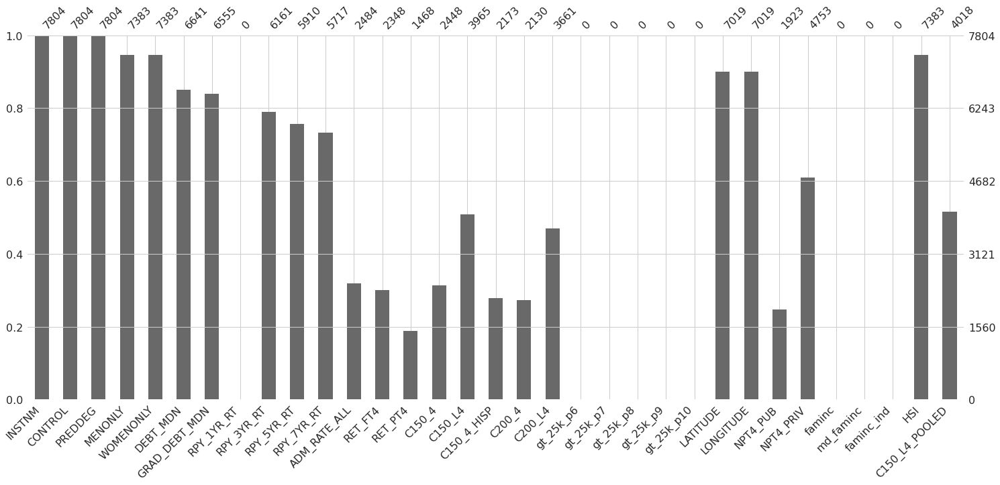

In [7]:
# Analisis de valores nulos, porcetaje de valores nulos en el dataset.}
msno.bar(reduced_df)

Entre las variables seleccionadas, se presentan bastantes valores nulos, algunos incluso tienen el 100% de los datos faltantes por lo que se procede a realizar una matriz de correlación de valores nulos para tomar una decisión con respecto a ellos.

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


<AxesSubplot:>

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


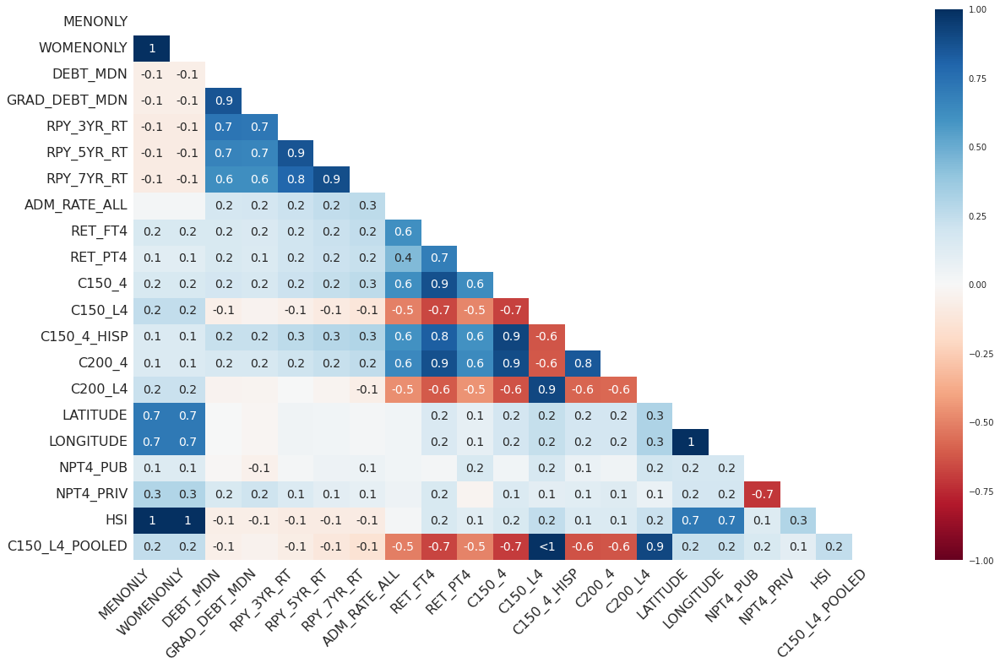

In [8]:
msno.heatmap(reduced_df)

Se decide trabajar con aquellas variables que tienen menos del 50% de valores nulos.

In [9]:
rate_null = (reduced_df.isnull().sum()/reduced_df.shape[0]) *100
filter_index = rate_null[rate_null<50]
df_filter = reduced_df[filter_index.index].copy()

Así que las variables finales que se incluirán en el análisis son las siguientes: 

In [10]:
nuevas_variables = df_filter.isnull().sum() / df_filter.shape[0]
nuevas_variables.to_frame(name='Porcentaje valores nulos').style

,Porcentaje valores nulos
INSTNM,0.000000
CONTROL,0.000000
PREDDEG,0.000000
MENONLY,0.053947
WOMENONLY,0.053947
DEBT_MDN,0.149026
GRAD_DEBT_MDN,0.160046
RPY_3YR_RT,0.210533
RPY_5YR_RT,0.242696
RPY_7YR_RT,0.267427


##### Variables numéricas y categoricas.
Para proceder con el análisis, se realizó la siguiente modificación a las variables finales:
* Los valores faltantes en las columnas con variables de tipo categórica se reemplazan por la moda de los datos la columna.
* Los valores faltantes en las columnas con variables de tipo numérica, se reemplazan por la mediana de los datos de la columna.

In [11]:
columns = df_filter.columns
variables_categorical = ["CONTROL", "PREDDEG", "MENONLY", "WOMENONLY", "HSI"]
variables_numerical = []
df_filter[variables_categorical] = df_filter[variables_categorical].astype("category")

In [12]:
for col in columns:
    if df_filter[col].dtype == "float64":
        variables_numerical.append(col)

In [13]:
# Si aplicar el cambio
l = df_filter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7804 entries, 0 to 7803
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   INSTNM          7804 non-null   object  
 1   CONTROL         7804 non-null   category
 2   PREDDEG         7804 non-null   category
 3   MENONLY         7383 non-null   category
 4   WOMENONLY       7383 non-null   category
 5   DEBT_MDN        6641 non-null   float64 
 6   GRAD_DEBT_MDN   6555 non-null   float64 
 7   RPY_3YR_RT      6161 non-null   float64 
 8   RPY_5YR_RT      5910 non-null   float64 
 9   RPY_7YR_RT      5717 non-null   float64 
 10  C150_L4         3965 non-null   float64 
 11  LATITUDE        7019 non-null   float64 
 12  LONGITUDE       7019 non-null   float64 
 13  NPT4_PRIV       4753 non-null   float64 
 14  HSI             7383 non-null   category
 15  C150_L4_POOLED  4018 non-null   float64 
dtypes: category(5), float64(10), object(1)
memory usage: 709.6+ 

In [14]:
df_filter[variables_categorical].astype("category")

def filles_null_values(df_filter):
    for col in df_filter.columns:
        if col in variables_categorical:
            df_filter[col].fillna(df_filter[col].mode().values[0])
        elif col in variables_numerical:
            df_filter[col].fillna(df_filter[col].median())

df_filter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7804 entries, 0 to 7803
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   INSTNM          7804 non-null   object  
 1   CONTROL         7804 non-null   category
 2   PREDDEG         7804 non-null   category
 3   MENONLY         7383 non-null   category
 4   WOMENONLY       7383 non-null   category
 5   DEBT_MDN        6641 non-null   float64 
 6   GRAD_DEBT_MDN   6555 non-null   float64 
 7   RPY_3YR_RT      6161 non-null   float64 
 8   RPY_5YR_RT      5910 non-null   float64 
 9   RPY_7YR_RT      5717 non-null   float64 
 10  C150_L4         3965 non-null   float64 
 11  LATITUDE        7019 non-null   float64 
 12  LONGITUDE       7019 non-null   float64 
 13  NPT4_PRIV       4753 non-null   float64 
 14  HSI             7383 non-null   category
 15  C150_L4_POOLED  4018 non-null   float64 
dtypes: category(5), float64(10), object(1)
memory usage: 709.6+ 

### Análisis univariable

#### Control
Esta variable identifica si la estructura de la institución es pública (1), privada sin fines de lucro (2) o privada con fines de lucro (3).

In [15]:
tabla = pd.crosstab(index=df_filter['CONTROL'], columns='Total',)
tabla['Porcentaje'] = round((tabla/tabla.sum()) * 100,2)
tabla.style

col_0,Total,Porcentaje
CONTROL,,
1,2073,26.560000
2,1969,25.230000
3,3762,48.210000


[Text(0, 0, 'Pública'),
 Text(0, 1, 'Privada sin ánimo de lucro'),
 Text(0, 2, 'Privada con ánimo de lucro')]

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


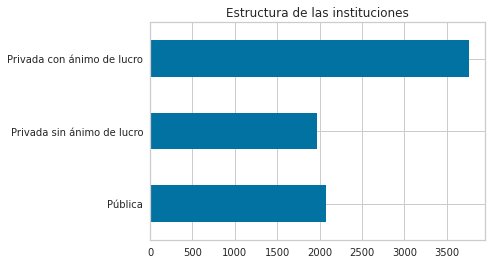

In [16]:
control_count_values = reduced_df['CONTROL'].value_counts().sort_index()
ax = control_count_values.plot(kind='barh', title = 'Estructura de las instituciones')
ax.set_yticklabels(('Pública', 'Privada sin ánimo de lucro', 'Privada con ánimo de lucro'))

Dentro de las instituciones analizadas el 48% son privadas y con ánimo de lucro, el 26% son de carácter público y el 25% restante son privadas sin ánimo de lucro.

#### PREDDEG

<AxesSubplot:>

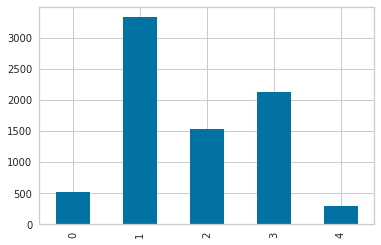

In [17]:
preddeg_count_values = reduced_df['PREDDEG'].value_counts().sort_index()
preddeg_count_values.plot.bar()

#### MENONLY

Esta variable puede tomar dos valores: 1, para aquellas instituciones que solo admiten hombres y 0 para aquellas que no es de solo hombres.

In [18]:
tabla = pd.crosstab(index=df_filter['MENONLY'], columns='Total',)
tabla['Porcentaje'] = round((tabla/tabla.sum()) * 100,2)
tabla.style

col_0,Total,Porcentaje
MENONLY,,
0.0,7316,99.090000
1.0,67,0.910000


(array([0, 1]), [Text(0, 0, 'No solo hombres'), Text(1, 0, 'Solo hombres')])

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


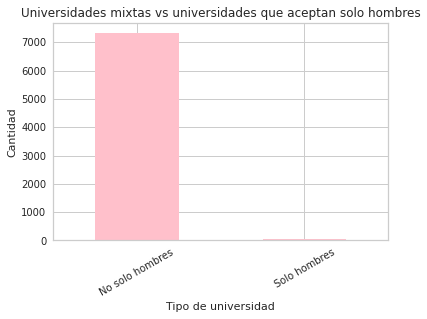

In [19]:
ax = tabla['Total'].plot.bar(xlabel = 'Tipo de universidad', ylabel = 'Cantidad', title = 'Universidades mixtas vs universidades que aceptan solo hombres', color = 'pink',)
ax.set_xticklabels(('No solo hombres', 'Solo hombres'))
plt.xticks(rotation=30)

La cantidad de universidades que no solo aceptan hombres (puede aceptar solo mujeres o ser mixtas), supera a las que solo aceptan hombres en, aproximadamente, un 98%. De las 7804 instituciones registradas, solo 67 es de solo hombres.

### WOMENONLY

Esta variable puede tomar dos valores: 1, para aquellas instituciones que solo admiten mujeres y 0 para aquellas que no es de solo mujeres.

In [20]:
tabla_women = pd.crosstab(index=df_filter['WOMENONLY'], columns='Total',)
tabla_women['Porcentaje'] = round((tabla_women/tabla_women.sum()) * 100,2)
tabla_women.style

col_0,Total,Porcentaje
WOMENONLY,,
0.0,7340,99.420000
1.0,43,0.580000


(array([0, 1]), [Text(0, 0, 'No solo mujeres'), Text(1, 0, 'Solo mujeres')])

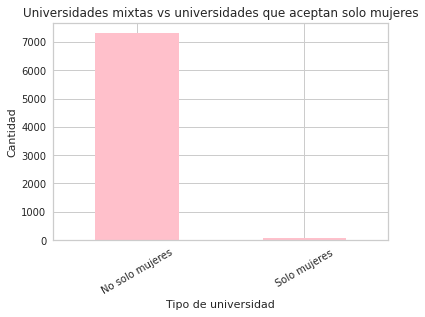

In [21]:
ax = tabla['Total'].plot.bar(xlabel = 'Tipo de universidad', ylabel = 'Cantidad', title = 'Universidades mixtas vs universidades que aceptan solo mujeres', color = 'pink',)
ax.set_xticklabels(('No solo mujeres', 'Solo mujeres'))
plt.xticks(rotation=30)

La cantidad de universidades que no solo aceptan mujeres (puede aceptar solo hombres o ser mixtas), supera a las que solo aceptan mujeres en, aproximadamente, un 99%. De las 7804 instituciones registradas, solo 43 acepta solo mujeres.

### DEBT_MDN

Esta variable representa la mediana de la deuda de préstamo acumulada en la institución por todos los estudiantes que se gradúan o se retiran

In [22]:
l = df_filter.DEBT_MDN.describe()
l.to_frame().style

,DEBT_MDN
count,6641.000000
mean,11829.782262
std,5709.625850
min,333.000000
25%,7710.000000
50%,9833.000000
75%,15462.000000
max,131335.000000


<AxesSubplot:title={'center':'Acumulación de deuda de los estudiantes\nGraduados y retirados'}, ylabel='Deuda acumulada (Dólares)'>

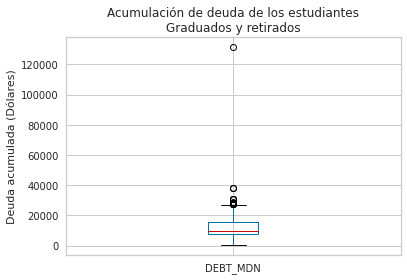

In [23]:
df_filter.DEBT_MDN.plot.box( title = 'Acumulación de deuda de los estudiantes\nGraduados y retirados', ylabel='Deuda acumulada (Dólares)')

En la gráfica se puede observar que las deudas acumuladas de los estudiantes varían, en general, entre $333 y $15462 dólares. Sin embargo se presentan algunos valores atípicos, los cuales se concentran especialmente en aproximadamente $23214 y $40000 dólares, alcanzando el máximo en $131335 dólares. La mediana de las deudas acumuladas por los estudiantes es de $9833 dólares, lo que quiere decir que el 50% de las deudas son inferiores a ese valor.

#### GRAD_DEBT_MDN
Esta variable representa también la mediana de la deuda acumulada por los estudiantes con préstamos federales, solo que son datos de solamente los estudiantes que completaron su carrera

In [24]:
l = df_filter.GRAD_DEBT_MDN.describe()
l.to_frame().style

,GRAD_DEBT_MDN
count,6555.000000
mean,16906.350648
std,8840.828706
min,723.500000
25%,9500.000000
50%,14144.000000
75%,24546.000000
max,53831.500000


<AxesSubplot:title={'center':'Acumulación de deuda de los estudiantes\ngraduados'}, ylabel='Deuda acumulada (Dólares)'>

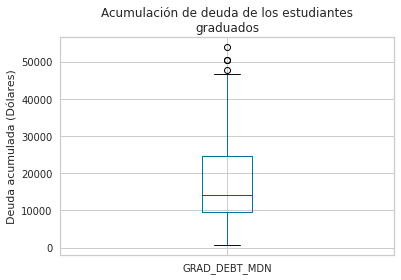

In [25]:
df_filter.GRAD_DEBT_MDN.plot.box( title = 'Acumulación de deuda de los estudiantes\ngraduados', ylabel='Deuda acumulada (Dólares)')

Con respecto a los estudiantes graduados, la mínima deuda acumulada es de $723.5 dólares, y la mayoría de los datos se concentran entre $9500 y $24546 dólares. El 50% de las deudas no superan $14144 dólares, sin embargo, hay algunos valores atípicos que están entre $47115 y $53831. 

#### RPY_*YR_RT
Esta variable representa la fracción de estudiantes de cada institución, que han adquirido un préstamo federal, no han incumplido con su préstamo y están progresando en su pago, después de haber salido de la institución.
* RPY_3YR_RT --> Datos para <b>tres</b> años después de haber salido de la institución
* RPY_5YR_RT --> Datos para <b> cinco </b> años después de haber salido de la institución
* RPY_7YR_RT --> Datos para <b> siete </b> años después de haber salido de la institución

In [26]:
l = df_filter[['RPY_3YR_RT','RPY_5YR_RT','RPY_7YR_RT']].describe()
l.style

,RPY_3YR_RT,RPY_5YR_RT,RPY_7YR_RT
count,6161.000000,5910.000000,5717.000000
mean,0.592577,0.619500,0.696311
std,0.202121,0.190070,0.161053
min,0.000000,0.090323,0.184783
25%,0.436446,0.470262,0.581588
50%,0.579019,0.606989,0.700446
75%,0.763398,0.775916,0.830882
max,1.000000,1.000000,1.000000


Text(0.5, 1.12, 'Fracción de estudiantes que avanzan en el pago de sus préstamos\n(Después de 3,5 y 7 años de salir de la universidad)')

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


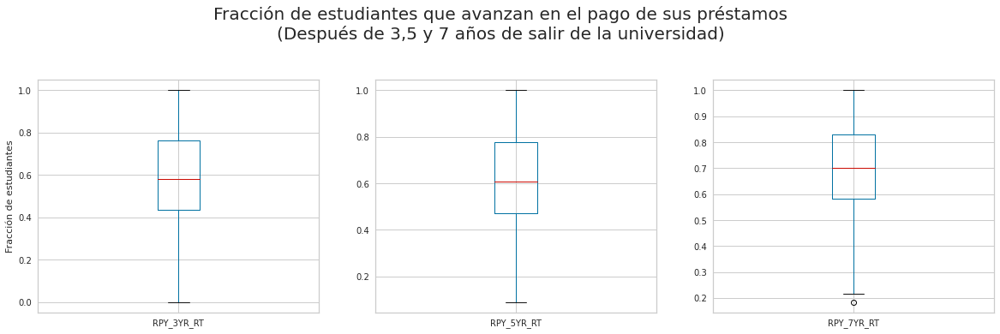

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
df_filter.RPY_3YR_RT.plot.box(ax=axes[0], ylabel='Fracción de estudiantes')
df_filter.RPY_5YR_RT.plot.box(ax=axes[1])
df_filter.RPY_7YR_RT.plot.box(ax=axes[2])
fig.suptitle('Fracción de estudiantes que avanzan en el pago de sus préstamos\n(Después de 3,5 y 7 años de salir de la universidad)', y=1.12, size=20)

Al comparar los datos de estas variables, se puede observar que a medida que van pasando los años, los estudiantes que avanzan con sus pagos van aumentando de a poco, por ejemplo, en el año 3 en el 50% de las universidades, al menos del 57% de sus ex-estudiantes empezaron a pagar; en el año 5 ese porcentaje subió al 60%, y para el año 7 subió hasta el 70%. Es decir, para el año 7, en el 50% de las universidades, al menos el 70% de los estudiantes avanzan con el pago de sus deudas.

Entre los 3 y 5 años de haber dejado la universidad, no hay mucha variabilidad, lo que indica que en ese periodo, pocos estudiantes empiezan a pagar sus deudas. Entre 5 y 7 años se nota un cambio un poco más significativo.

#### C150_L4 Y C150_L4_POOLED
Esta variable representa la tasa de finalización por cada universidad en carreras de menos de 4 años, esta medida indica quienes terminan su carrera dentro del 150% del tiempo en el que esperaban graduarse.
Para reducir la variabilidad de un año a otro, los datos también están disponibles como
tasas de finalización agrupadas a lo largo de dos años de forma continua (<b>C_150_L4_POOLED</b>)

In [28]:
l = df_filter[['C150_L4', 'C150_L4_POOLED']].describe()
l.style

,C150_L4,C150_L4_POOLED
count,3965.000000,4018.000000
mean,0.558966,0.562329
std,0.259476,0.250625
min,0.000000,0.000000
25%,0.330100,0.353096
50%,0.610800,0.616015
75%,0.762700,0.759985
max,1.000000,1.000000


Text(0.5, 1.05, 'Tasa de finalización\n(Dentro del 150% del tiempo esperado)')

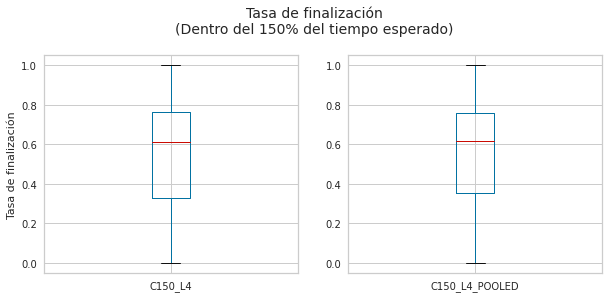

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,4))
df_filter.C150_L4.plot.box(ax=axes[0], ylabel='Tasa de finalización')
df_filter.C150_L4_POOLED.plot.box(ax=axes[1])
fig.suptitle('Tasa de finalización\n(Dentro del 150% del tiempo esperado)', y=1.05, size=14)

### LATITUDE y LONGITUDE

/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LATITUDE'>

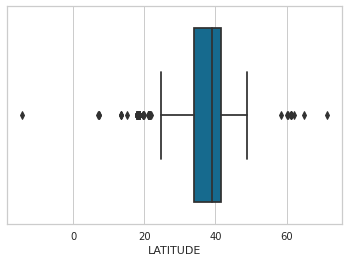

In [30]:
sns.boxplot(df_filter.LATITUDE)

/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LONGITUDE'>

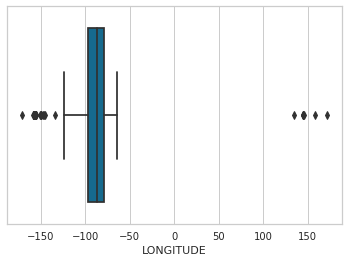

In [31]:
sns.boxplot(df_filter.LONGITUDE)

### NPT4_PRIV

/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NPT4_PRIV'>

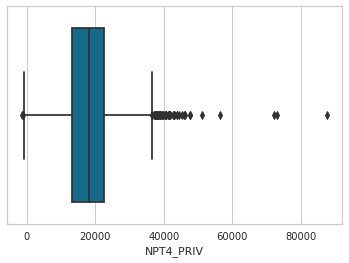

In [32]:
sns.boxplot(df_filter.NPT4_PRIV)

### HSI

In [33]:
#sns.boxplot(df_filter.HSI)

<AxesSubplot:>

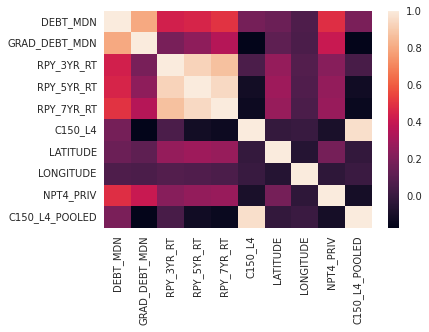

In [34]:
sns.heatmap(df_filter[variables_numerical].corr())

Las variables con correlación más alta son:

RPY_3TR_RT, RPY_5TR_RT, RPY_7TR_RT

C150_L4 CL150_l4_POOLED

GRAD_DEBT_MDN EBT_MDN

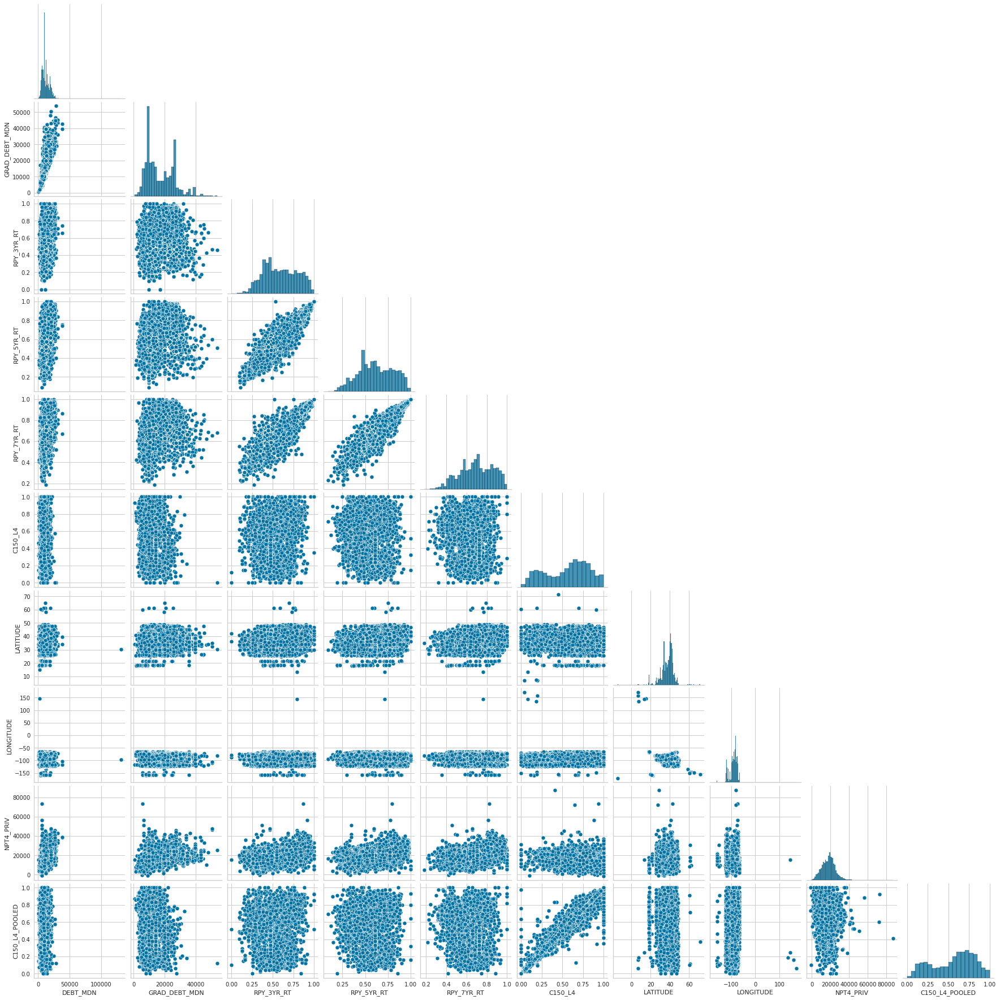

In [35]:
sns.pairplot(df_filter[variables_numerical], corner=True)

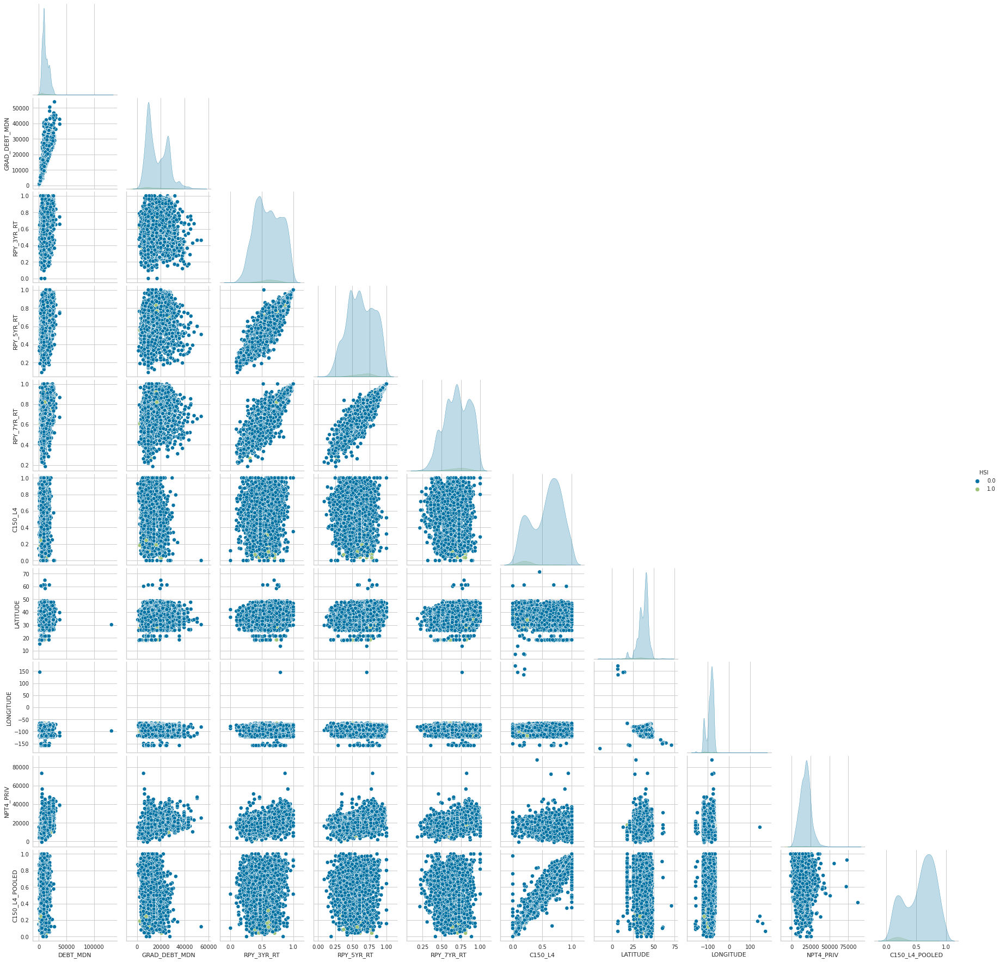

In [36]:
sns.pairplot(df_filter, hue ="HSI" ,corner=True)

Las variables numericas que tienen correlació más alta son:

- RPY_3YR_RT | RPY_5YR_RT | RPY_7YR_RT

- C150_L4 | C150_L4_POOLED

- GRAD_DEBT_MDN | DEBT_MDN

### GRAD_DEBT_MDN vs DEBT_MDN

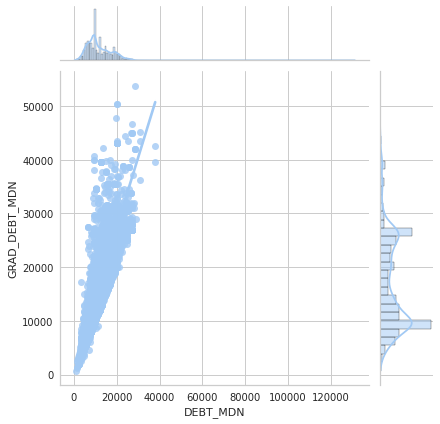

In [37]:
sns.set_palette(sns.color_palette('pastel'))
g = sns.jointplot(x = 'DEBT_MDN', y = 'GRAD_DEBT_MDN', data = reduced_df,
                kind = 'reg')

7804 | DEBT_MDN -> 6507 O.o (134 deberían restarse)

In [103]:
# Outlayers
# Variables con outlayres: DEBT_MDN | GRAD_DEBT_MDN | NPT4_PRIV| RPY_7YR_RT
df_filter_aux = df_filter.copy()

#DEBT_MDN
#filter_DEBT_MDN_lower = df_filter.DEBT_MDN.quantile(.01) <=  df_filter_aux.DEBT_MDN
#filter_DEBT_MDN_higher = df_filter_aux.DEBT_MDN <= df_filter.DEBT_MDN.quantile(.99) 
#df_filter_aux.where(filter_DEBT_MDN_lower, inplace= True)
#df_filter_aux = df_filter_aux[(df_filter.DEBT_MDN.quantile(.01) <= df_filter_aux.DEBT_MDN) &
#                       (df_filter_aux.DEBT_MDN <= df_filter.DEBT_MDN.quantile(.99))]


#GRAD_DEBT_MDN
#df_filter_aux = df_filter_aux[(df_filter.GRAD_DEBT_MDN.quantile(.01) <= df_filter_aux.GRAD_DEBT_MDN) &
#                       (df_filter_aux.GRAD_DEBT_MDN <= df_filter.GRAD_DEBT_MDN.quantile(.99))]

#NPT4_PRIV
#df_filter_aux = df_filter_aux[(df_filter.NPT4_PRIV.quantile(.01) <= df_filter_aux.NPT4_PRIV) &
#                        (df_filter_aux.NPT4_PRIV <= df_filter.NPT4_PRIV.quantile(.99))]

print(np.percentile(df_filter.DEBT_MDN,99, axis = 0))
print(df_filter_aux[(np.percentile(df_filter.DEBT_MDN,99) < df_filter_aux.DEBT_MDN)].shape[0])
df_filter_aux.shape, df_filter.shape

nan
0


((7804, 30), (7804, 30))

In [39]:
df_filter.to_csv('df_filter.csv')

In [40]:
def addes_null_value_column(df_filter):
    """Esta tecnica agrega más información a nuestro modelo
        Más información: https://www.kaggle.com/code/dansbecker/handling-missing-values/notebook
        Extract_column method
    """
    cols_with_missing = [col for col in df_filter.columns 
                                    if df_filter[col].isnull().any()]
    new_categorical = []
    for col in cols_with_missing:
        name = col + '_was_missing'
        df_filter[name] = df_filter[col].isnull().astype(float)
        new_categorical.append(name)
    return df_filter.copy(), new_categorical

In [41]:
# Preprosecing the values with sklearn
extract_tecnic = True


numerical_preprocessor = pipeline.Pipeline(steps=[
    ("imputer", impute.SimpleImputer(strategy="mean")),
    ("scaler", preprocessing.StandardScaler())
])

categorical_preprocessor = pipeline.Pipeline(steps=[
    ("imputer", impute.SimpleImputer(strategy="most_frequent")),
    ("onehot", preprocessing.OneHotEncoder(handle_unknown="ignore"))
])

normal_values_preprocessor = pipeline.Pipeline(steps=[
     ("imputer", impute.SimpleImputer(strategy="most_frequent"))
])

if extract_tecnic:

    df_filter,new_categorical = addes_null_value_column(df_filter)
    preprocessor = compose.ColumnTransformer(
        transformers=[
            ("numerical_preprocessor", numerical_preprocessor, variables_numerical),
            ("categorical_preprocessor", categorical_preprocessor, variables_categorical),
         ("normal_values_preprocessor", normal_values_preprocessor, new_categorical)
        ]
    )

else:
    preprocessor = compose.ColumnTransformer(
        transformers=[
            ("numerical_preprocessor", numerical_preprocessor, variables_numerical),
            ("categorical_preprocessor", categorical_preprocessor, variables_categorical),
        ]
    )



# Model pipeline
pca = PCA(n_components=0.86)
kmeans = KMeans(random_state=999)
visualizer = KElbowVisualizer(kmeans, k=(1,12))

pca_pipeline = pipeline.Pipeline(steps=[
    ("preprocessing", preprocessor),
    ("PCA",pca )
])

data_transform = pca_pipeline.fit_transform(df_filter)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode = stats.mode(array)
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid

In [42]:
data_transform.shape

(7804, 8)

[3.7877381  2.18741092 1.64432847 1.11940641 0.92108177 0.7819706
 0.55209049 0.47687   ]


Text(0.5, 1.0, 'Scree Plot')

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


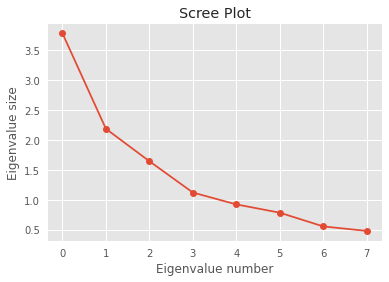

In [43]:
print(pca.explained_variance_)

import matplotlib.pyplot as plt
plt.style.use("ggplot") 
plt.plot(pca.explained_variance_, marker='o')
plt.xlabel("Eigenvalue number")
plt.ylabel("Eigenvalue size")
plt.title("Scree Plot")

In [44]:
# Sacada de la siguiente varaible https://towardsdatascience.com/how-to-select-the-best-number-of-principal-components-for-the-dataset-287e64b14c6d
variables_numerical[:6]

['DEBT_MDN',
 'GRAD_DEBT_MDN',
 'RPY_3YR_RT',
 'RPY_5YR_RT',
 'RPY_7YR_RT',
 'C150_L4']

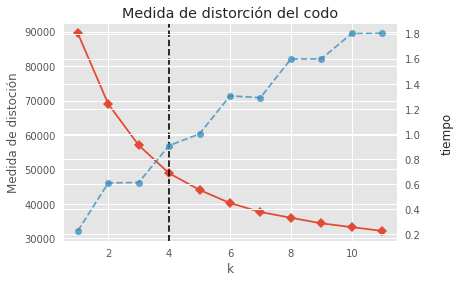

In [45]:
#Diagrama del coodo
import matplotlib.pyplot as plt
visualizer = KElbowVisualizer(kmeans, k=(1,12)).fit(data_transform)

visualizer.ax.set_xlabel("k")
visualizer.ax.set_ylabel("Medida de distoción")
plt.title("Medida de distorción del codo")
plt.gcf().text(1, 0.5, "tiempo", fontsize=12, va='center', rotation="90")
plt.show()

In [46]:
best_model = KMeans(n_clusters = 4, random_state=999)
kmeans_pipeline = pipeline.Pipeline(steps=[
    ("data_transform", pca_pipeline),
    ("kmeans", best_model)
])

kmeans_pipeline

Pipeline(steps=[('data_transform',
                 Pipeline(steps=[('preprocessing',
                                  ColumnTransformer(transformers=[('numerical_preprocessor',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer()),
                                                                                   ('scaler',
                                                                                    StandardScaler())]),
                                                                   ['DEBT_MDN',
                                                                    'GRAD_DEBT_MDN',
                                                                    'RPY_3YR_RT',
                                                                    'RPY_5YR_RT',
                                                                    'RPY_7YR_RT',
                                                                    'C150_L4',
                                                                    'LATITUDE',
                                                                    'LONGITUDE',
                                                                    'NPT4_PRIV',
                                                                    'C150_L4_POOLED']),
                                                                  ('categorical_prepro...
                                                                    'DEBT_MDN_was_missing',
                                                                    'GRAD_DEBT_MDN_was_missing',
                                                                    'RPY_3YR_RT_was_missing',
                                                                    'RPY_5YR_RT_was_missing',
                                                                    'RPY_7YR_RT_was_missing',
                                                                    'C150_L4_was_missing',
                                                                    'LATITUDE_was_missing',
                                                                    'LONGITUDE_was_missing',
                                                                    'NPT4_PRIV_was_missing',
                                                                    'HSI_was_missing',
                                                                    'C150_L4_POOLED_was_missing'])])),
                                 ('PCA', PCA(n_components=0.86))])),
                ('kmeans', KMeans(n_clusters=4, random_state=999))])

In [47]:
_ =  kmeans_pipeline.fit_transform(df_filter)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode = stats.mode(array)
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/impute/_base.py:54: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid

In [48]:
df_filter["Cluster"] = best_model.labels_
df_filter.to_csv(f'df_filter_cluster_{extract_tecnic}.csv')
val =  variables_numerical + ["Cluster"]

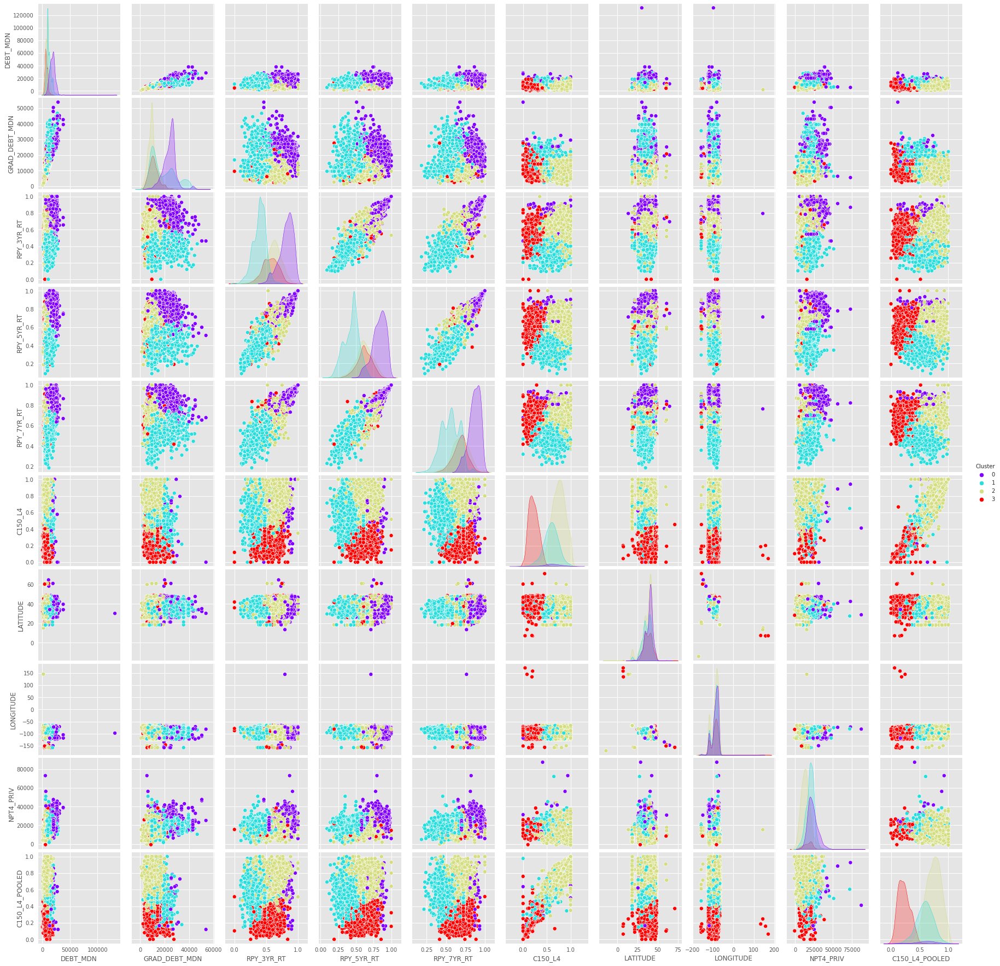

In [49]:
sns.pairplot(df_filter[val], hue="Cluster",palette="rainbow")

In [50]:
def caracterization(num_cluster, df):
    print(f"GRUPO {num_cluster}:")
    mask=df.loc[:, "Cluster"]== num_cluster
    group=df[mask]
    print(group.head())
    print(group.shape)
    print(group.describe())

    sns.pairplot(group,
                height=3, 
                kind='scatter')
    plt.show()

GRUPO 4:
Empty DataFrame
Columns: [DEBT_MDN, GRAD_DEBT_MDN, RPY_3YR_RT, RPY_5YR_RT, RPY_7YR_RT, C150_L4, LATITUDE, LONGITUDE, NPT4_PRIV, C150_L4_POOLED, Cluster]
Index: []
(0, 11)
       DEBT_MDN  GRAD_DEBT_MDN  RPY_3YR_RT  RPY_5YR_RT  RPY_7YR_RT  C150_L4  \
count       0.0            0.0         0.0         0.0         0.0      0.0   
mean        NaN            NaN         NaN         NaN         NaN      NaN   
std         NaN            NaN         NaN         NaN         NaN      NaN   
min         NaN            NaN         NaN         NaN         NaN      NaN   
25%         NaN            NaN         NaN         NaN         NaN      NaN   
50%         NaN            NaN         NaN         NaN         NaN      NaN   
75%         NaN            NaN         NaN         NaN         NaN      NaN   
max         NaN            NaN         NaN         NaN         NaN      NaN   

       LATITUDE  LONGITUDE  NPT4_PRIV  C150_L4_POOLED  Cluster  
count       0.0        0.0        0.0      

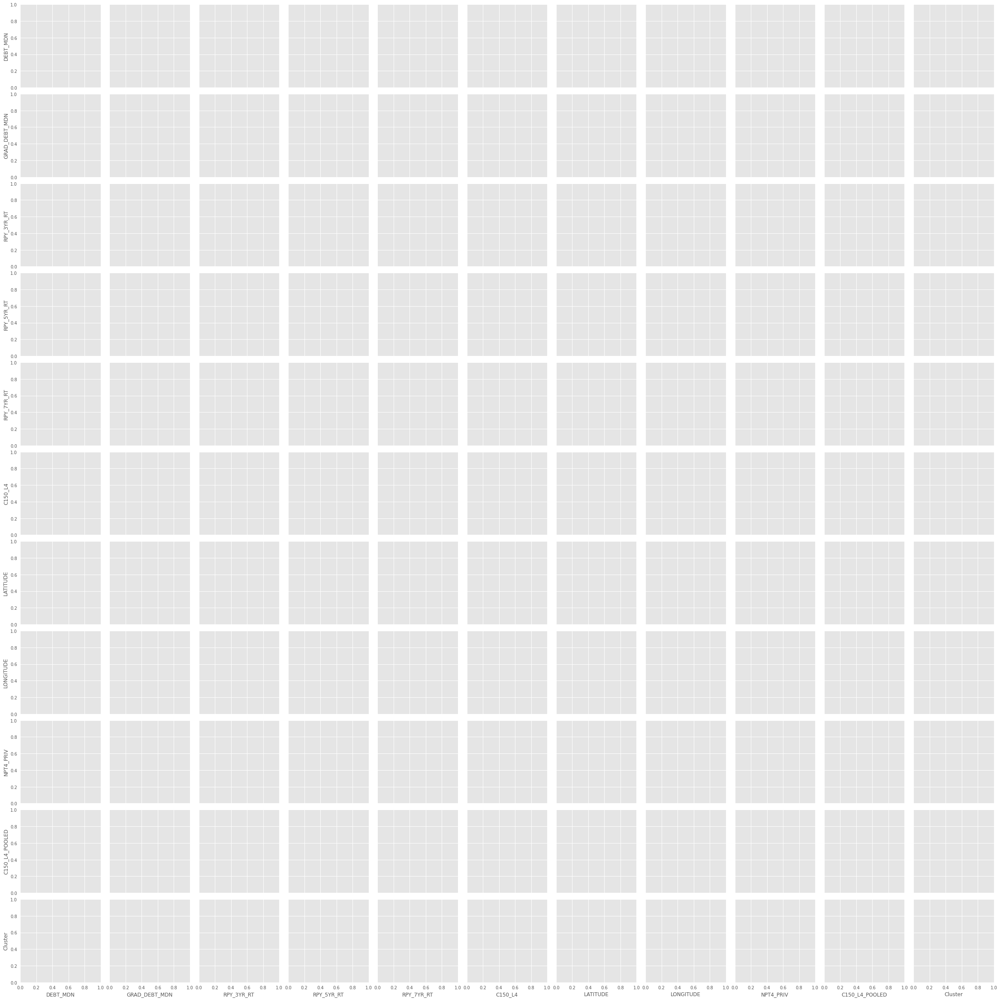

In [51]:
caracterization(4, df_filter[val])

In [52]:
mask=df_filter.loc[:, "Cluster"]== 0

In [53]:
val_nulos = list(map(lambda x: x.replace("_was_missing", ""), new_categorical))

def filters_values_null(df_filter, cluster):
    global val_nulos
    group  = df_filter[df_filter["Cluster"] == cluster]
    msno.bar(group[val_nulos])

def filters_corr(df_filter, cluster):
    global variables_numerical
    group  = df_filter[df_filter["Cluster"] == cluster]
    sns.heatmap(group[variables_numerical].corr())

def filters_descriptive(df_filter, cluster):
    group  = df_filter[df_filter["Cluster"] == cluster]
    print(group.describe())

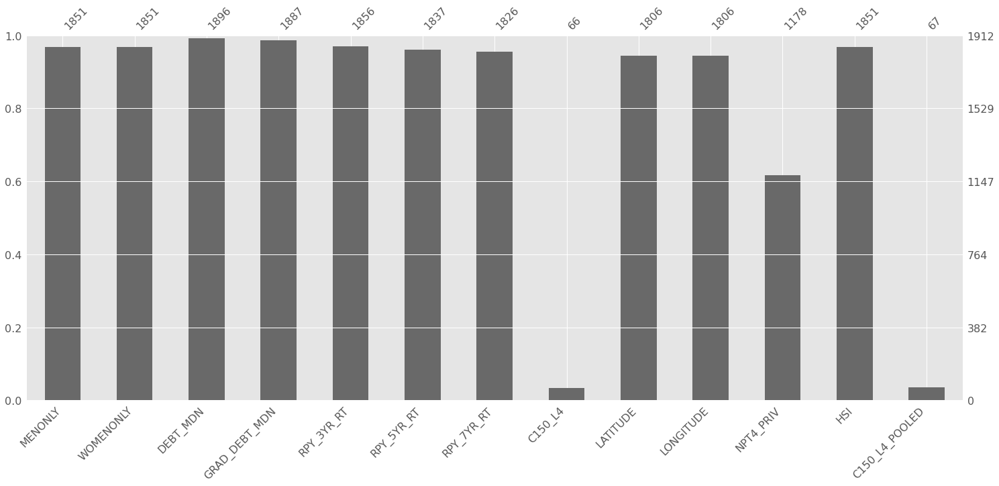

In [54]:
filters_values_null(df_filter, 0)

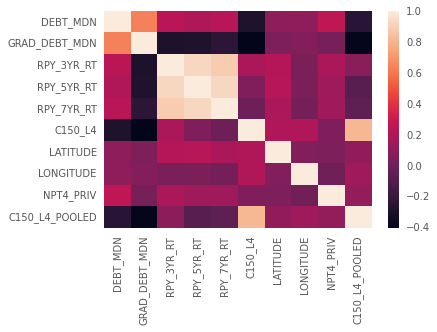

In [55]:
filters_corr(df_filter, 0)

In [56]:
filters_descriptive(df_filter, 0)

            DEBT_MDN  GRAD_DEBT_MDN   RPY_3YR_RT   RPY_5YR_RT   RPY_7YR_RT  \
count    1896.000000    1887.000000  1856.000000  1837.000000  1826.000000   
mean    17853.497099   23994.973238     0.814303     0.825193     0.865315   
std      5170.116864    5407.088966     0.106920     0.096001     0.073956   
min      5500.000000    5500.000000     0.440756     0.500000     0.628644   
25%     14637.375000   21000.000000     0.755687     0.766228     0.822107   
50%     18089.500000   25000.000000     0.833369     0.839812     0.874142   
75%     20750.000000   27000.000000     0.893916     0.899461     0.922380   
max    131335.000000   53831.500000     1.000000     1.000000     1.000000   

         C150_L4     LATITUDE    LONGITUDE     NPT4_PRIV  C150_L4_POOLED  ...  \
count  66.000000  1806.000000  1806.000000   1178.000000       67.000000  ...   
mean    0.582267    39.082924   -88.527384  23036.229202        0.579658  ...   
std     0.225548     4.781917    16.142319   6922.0076

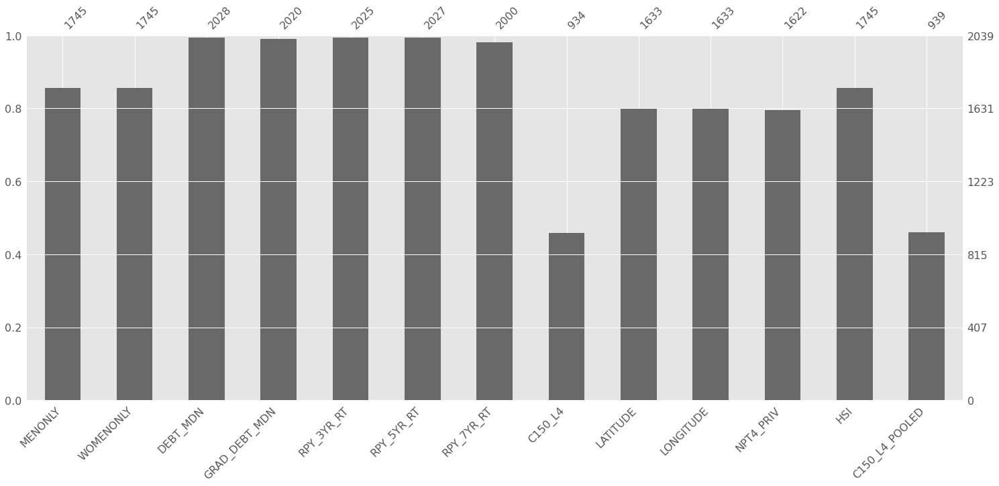

In [57]:
filters_values_null(df_filter, 1)

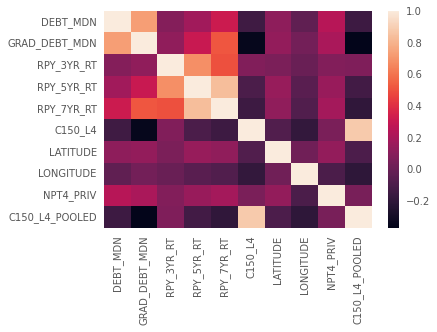

In [58]:
filters_corr(df_filter, 1)

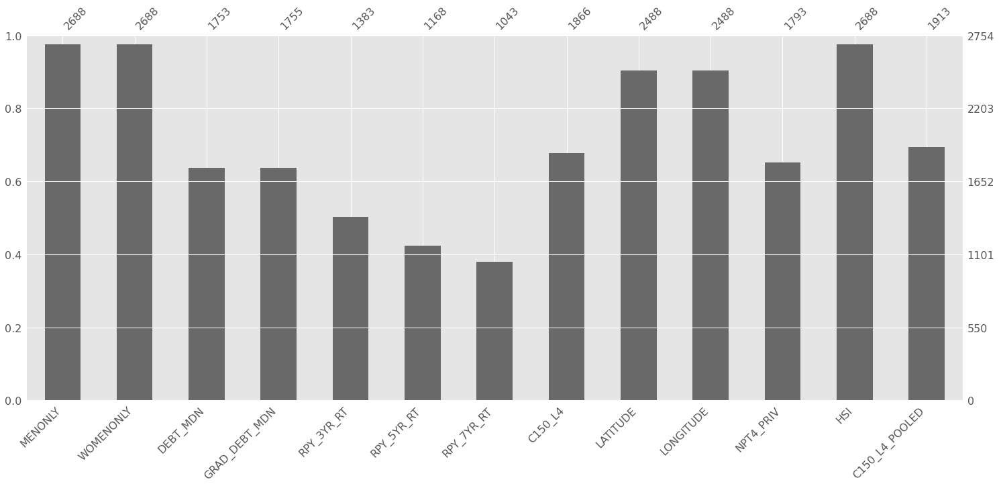

In [59]:
filters_values_null(df_filter, 2)

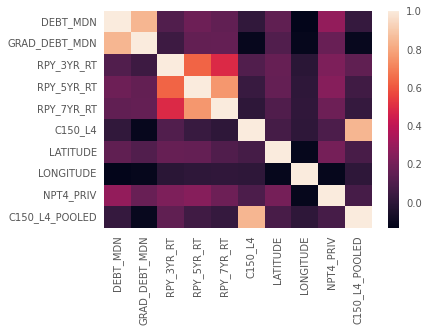

In [60]:
filters_corr(df_filter, 2)

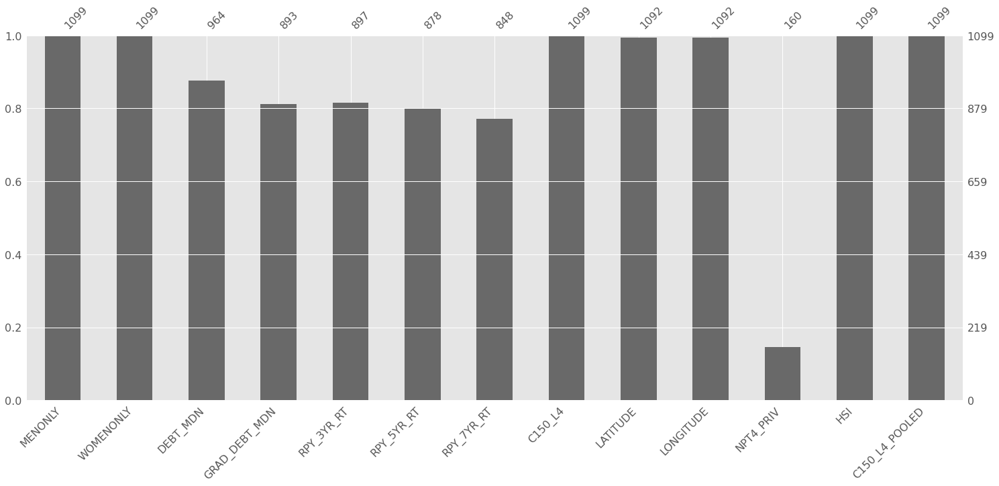

In [61]:
filters_values_null(df_filter, 3)

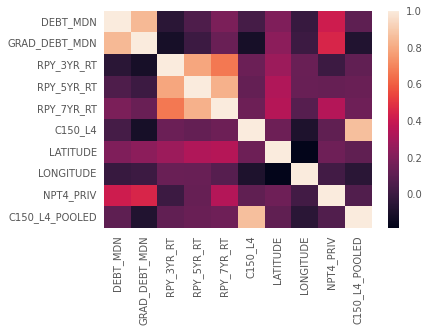

In [62]:
filters_corr(df_filter, 3)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=75e34ce2-1641-4c65-be6d-29564b23ed4c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>